In [1]:
import numpy as np
import pandas as pd

import scipy.io

# Load the .mat file
mat_file = scipy.io.loadmat('data_assign3.mat')

# List the headers and all keys in the .mat file
for key in mat_file.keys():
    print(key)

# Extract the data from the .mat file
gain_mat = mat_file['Gain_cell']

# Reshape the data to have 5000 rows and 40 columns
reshaped_data = np.array([gain_mat[0][i].flatten() for i in range(5000)])
Gain_cell = pd.DataFrame(reshaped_data)
Gain_cell.shape

__header__
__version__
__globals__
Gain_cell
noise_figure_cell
pump_pwer_cell
pump_wavelength_cell


(5000, 40)

In [2]:
power_mat = mat_file['pump_pwer_cell']
power_mat = np.array([power_mat[0][i].flatten() for i in range(5000)])
power_mat
Raman_power = pd.DataFrame(power_mat)
Raman_power

wavelegnth_mat = mat_file['pump_wavelength_cell']
wavelegnth_mat = np.array([wavelegnth_mat[0][i].flatten() for i in range(5000)])
wavelegnth_mat
Raman_wavelength = pd.DataFrame(wavelegnth_mat)
Raman_wavelength

,0,1,2
0,1432.983062,1446.144803,1466.034761
1,1435.104952,1444.734280,1477.912074
2,1416.958793,1460.274990,1481.402421
3,1435.281657,1454.033615,1480.719498
4,1428.733970,1446.927172,1474.571222
...,...,...,...
4995,1419.924775,1444.478192,1481.957652
4996,1427.761182,1445.287326,1483.830348
4997,1417.705808,1443.653473,1464.530769
4998,1427.323631,1444.405567,1460.817010


In [3]:
print(Gain_cell.shape)
print(Raman_power.shape)
print(Raman_wavelength.shape)

(5000, 40)
(5000, 3)
(5000, 3)


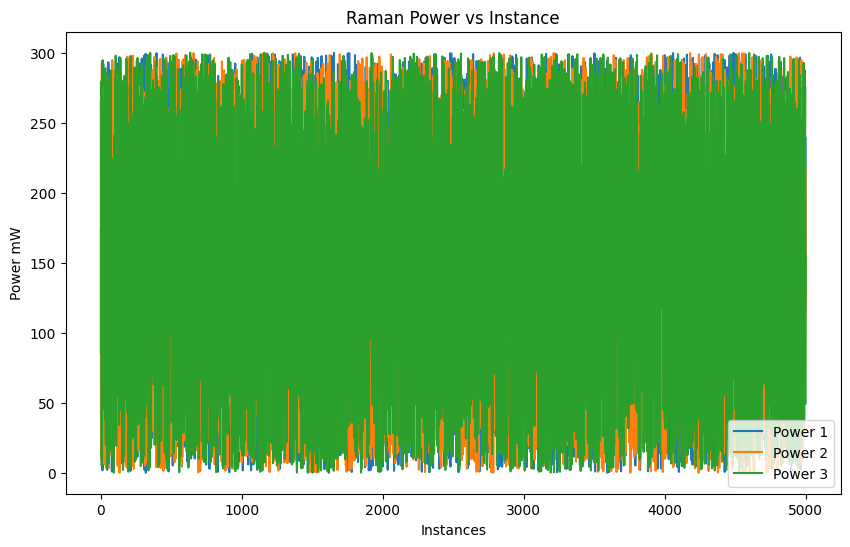

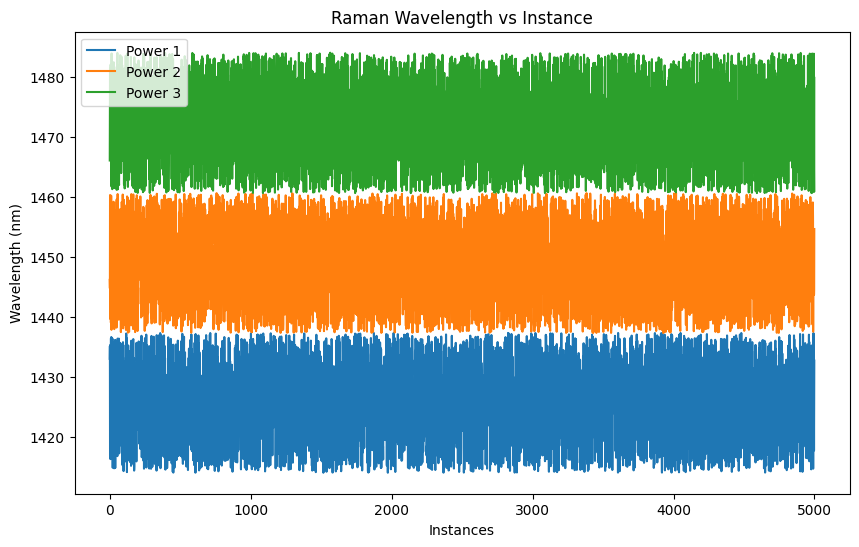

In [4]:
import plotly.express as px
import matplotlib.pyplot as plt

# Plot Raman_power
df_power = Raman_power
df_power.columns = [f'Power {i+1}' for i in range(Raman_power.shape[1])]
fig_power = px.line(df_power, labels={'value': 'Power(mW)', 'index': 'Instances'})
fig_power.update_layout(title='Raman Power(mW) vs Instance')
fig_power.show()

# Plot Raman_wavelength
df_wavelength = Raman_wavelength
df_wavelength.columns = [f'Power {i+1}' for i in range(Raman_wavelength.shape[1])]
fig_wavelength = px.line(df_wavelength, labels={'value': 'wavelength(nm)', 'index': 'Instances'})
fig_wavelength.update_layout(title='Wavelength vs Instance')
fig_wavelength.show()

plt.figure(figsize=(10, 6))
for i in range(Raman_power.shape[1]):
    plt.plot(Raman_power.index, Raman_power.iloc[:, i], label=f'Power {i+1}')
plt.title('Raman Power vs Instance')
plt.xlabel('Instances')
plt.ylabel('Power mW')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
for i in range(Raman_wavelength.shape[1]):
    plt.plot(Raman_wavelength.index, Raman_wavelength.iloc[:, i], label=f'Power {i+1}')
plt.title('Raman Wavelength vs Instance')
plt.xlabel('Instances')
plt.ylabel('Wavelength (nm)')
plt.legend()
plt.show()


In [5]:
import plotly.express as px

# Transpose Gain_cell to have channels as columns and gains as rows
df_gain = Gain_cell
df_gain.columns = [f'Channel {i+1}' for i in range(df_gain.shape[1])]

# Plot the data
fig = px.line(df_gain, labels={'value': 'Gain', 'index': 'Instances'})
fig.update_layout(title='Gain vs Channels', xaxis_title='Instances', yaxis_title='Gain')
fig.show()

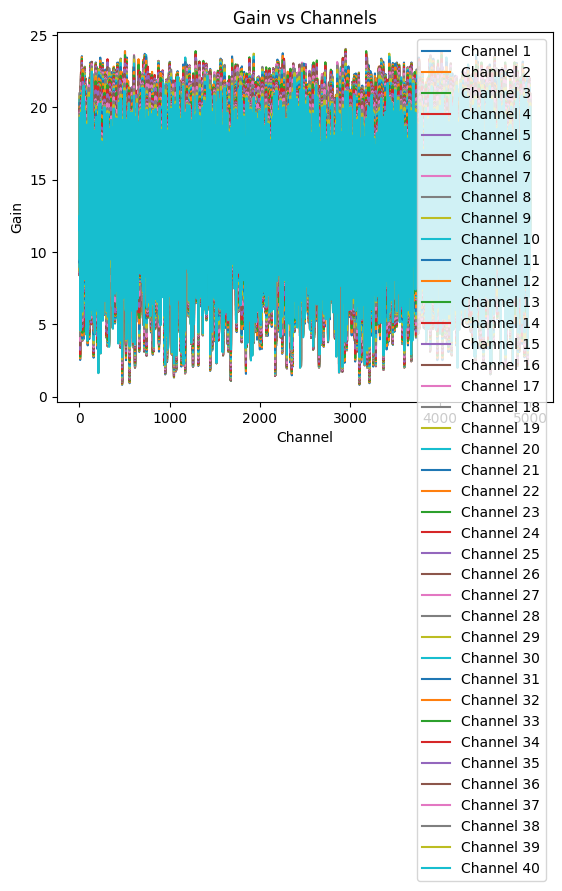

In [6]:
df_gain_example = Gain_cell.iloc[:, :5]
df_gain_example

for i in range(Gain_cell.iloc[:, :50].shape[1]):
    plt.plot(Gain_cell.index, Gain_cell.iloc[:, i], label=f'Channel {i+1}')

plt.title('Gain vs Channels')
plt.xlabel('Channel')
plt.ylabel('Gain')
plt.legend()
plt.show()

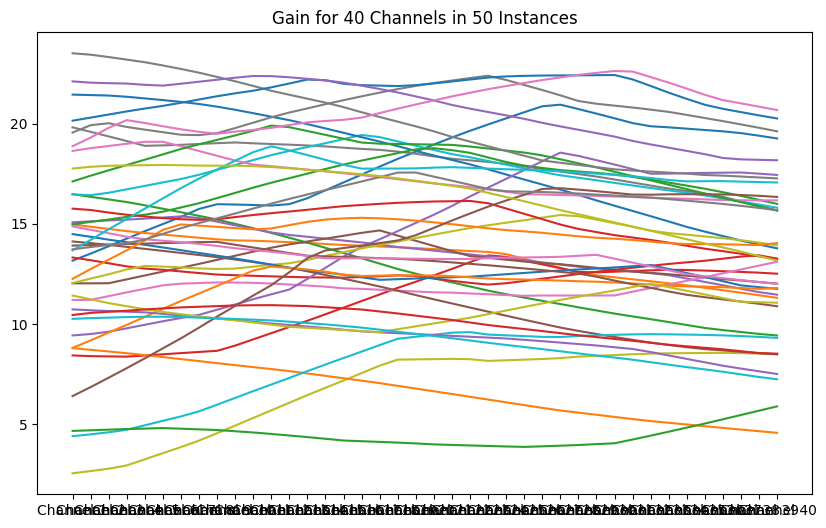

In [7]:
plt.figure(figsize=(10, 6))
for i in range(40):
    plt.plot(Gain_cell.columns, Gain_cell.iloc[i, :])
plt.title('Gain for 40 Channels in 50 Instances')
plt.show()

In [8]:
print(Gain_cell.shape)
print(Raman_power.shape)
print(Raman_wavelength.shape)

(5000, 40)
(5000, 3)
(5000, 3)


### So Gain_cell.T contains the value for each channel at instance k = 0 to 5000. (rows)
### The Raman_power and Raman_wavelength are the inputs to the nueral network. The corresponding gains are given in Gain_cell.T 

In [9]:
import numpy as np 
from sklearn.model_selection import train_test_split
import torch 
from torch import nn

Raman_training = np.hstack((Raman_power, Raman_wavelength))
X_train, X_test, Y_train, Y_test = train_test_split(Raman_training, Gain_cell, test_size=0.4, random_state=42)

X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

X_train = torch.tensor(X_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)

Y_train = np.array(Y_train)
Y_test = np.array(Y_test)
Y_train = torch.tensor(Y_train, dtype=torch.float32)
Y_test = torch.tensor(Y_test, dtype=torch.float32)

In [10]:
class SimpleNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(SimpleNN, self).__init__()
        self.hidden = nn.Linear(input_dim, hidden_dim)  # Hidden layer
        self.relu = nn.ReLU()  # Activation function
        self.output = nn.Linear(hidden_dim, output_dim)  # Output layer

    def forward(self, x):
        x = self.hidden(x)  # Linear transformation
        x = self.relu(x)  # Activation
        x = self.output(x)  # Output layer
        return x

In [141]:
class FlexibleNN(nn.Module):
    def __init__(self, input_dim, hidden_dims, output_dim, dropout_prob=0.2):
        """
        Create a flexible neural network with a variable number of layers.
        Parameters:
        - input_dim: Dimension of the input features
        - hidden_dims: List specifying the number of neurons in each hidden layer
        - output_dim: Dimension of the output
        """
        super(FlexibleNN, self).__init__()

        # Dynamically create the layers
        layers = []
        all_dims = [input_dim] + hidden_dims + [output_dim]

        # Add hidden layers
        for i in range(len(all_dims) - 2):
            layers.append(nn.Linear(all_dims[i], all_dims[i + 1]))
            layers.append(nn.ReLU())  # Activation function
            layers.append(nn.Dropout(dropout_prob))  # Dropout layer

        layers.append(nn.Linear(all_dims[-2], all_dims[-1]))
        # Combine all layers into a sequential module
        self.model = nn.Sequential(*layers)
        self._initialize_weights()


    def _initialize_weights(self):
        """
        Initialize weights using He initialization for linear layers
        and set biases to zero.
        """
        for layer in self.model:
            if isinstance(layer, nn.Linear):
                nn.init.kaiming_normal_(layer.weight)  # He Initialization
                nn.init.constant_(layer.bias, 0)       # Bias initialized to 0
    

    def forward(self, X):
        """
        Forward pass through the network.
        """
        return self.model(X)

In [154]:
import torch
import torch.nn as nn
import torch.optim as optim

# Define model parameters
input_dim = 6
hidden_dim = [40, 64, 32]
output_dim = 40

# Initialize the model
model = FlexibleNN(input_dim, hidden_dim, output_dim)

# Define the loss function (Mean Squared Error)
criterion = nn.MSELoss()

# Define the optimizer (Stochastic Gradient Descent)
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

# Training parameters
epochs = 300
batch_size = 64

# Convert training data into DataLoader for batching
train_dataset = torch.utils.data.TensorDataset(X_train, Y_train)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Training loop
for epoch in range(epochs):
    model.train()  # Set the model to training mode
    epoch_loss = 0

    for batch_X, batch_Y in train_loader:
        # Zero the gradient buffers
        optimizer.zero_grad()

        # Forward pass
        predictions = model(batch_X)

        # Compute loss
        loss = criterion(predictions, batch_Y)

        # Backward pass
        loss.backward()

        # Update weights
        optimizer.step()

        # Accumulate loss for the epoch
        epoch_loss += loss.item()

    # Print loss every 100 epochs
    if (epoch + 1) % 10 == 0:
        print(f"Epoch {epoch+1}/{epochs}, Loss: {epoch_loss/len(train_loader):.4f}")

# Testing the model
model.eval()  # Set the model to evaluation mode
with torch.no_grad():
    test_predictions = model(X_test)
    test_loss = criterion(test_predictions, Y_test)
    print(f"Test Loss: {test_loss:.4f}")

Epoch 10/300, Loss: 38.6087
Epoch 20/300, Loss: 34.0135
Epoch 30/300, Loss: 30.9273
Epoch 40/300, Loss: 31.0145
Epoch 50/300, Loss: 28.1788
Epoch 60/300, Loss: 26.9405
Epoch 70/300, Loss: 24.1095
Epoch 80/300, Loss: 25.2789
Epoch 90/300, Loss: 22.8401
Epoch 100/300, Loss: 20.9271
Epoch 110/300, Loss: 20.4961
Epoch 120/300, Loss: 19.0571
Epoch 130/300, Loss: 17.8707
Epoch 140/300, Loss: 17.2374
Epoch 150/300, Loss: 16.6652
Epoch 160/300, Loss: 15.4507
Epoch 170/300, Loss: 14.5078
Epoch 180/300, Loss: 14.0116
Epoch 190/300, Loss: 13.1466
Epoch 200/300, Loss: 12.5025
Epoch 210/300, Loss: 11.9416
Epoch 220/300, Loss: 10.5811
Epoch 230/300, Loss: 11.2203
Epoch 240/300, Loss: 9.8469
Epoch 250/300, Loss: 9.6260
Epoch 260/300, Loss: 8.6885
Epoch 270/300, Loss: 8.5344
Epoch 280/300, Loss: 7.6514
Epoch 290/300, Loss: 7.3426
Epoch 300/300, Loss: 5.6928
Test Loss: 4.1317


torch.Size([2000, 40])


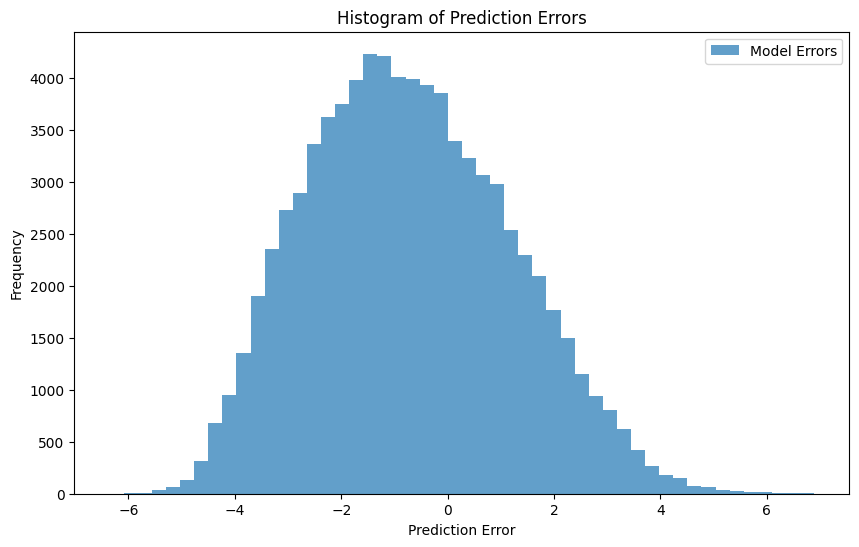

In [155]:
import matplotlib.pyplot as plt
print(test_predictions.shape)
# Compute prediction errors for the model
errors = (test_predictions - Y_test).detach().numpy().flatten()

# Plot histogram for errors
plt.figure(figsize=(10, 6))
plt.hist(errors, bins=50, alpha=0.7, label="Model Errors")
plt.title("Histogram of Prediction Errors")
plt.xlabel("Prediction Error")
plt.ylabel("Frequency")
plt.legend()
plt.show()

c:\Users\adop\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

c:\Users\adop\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

c:\Users\adop\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

c:\Users\adop\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

c:\Users\adop\AppData\Local\

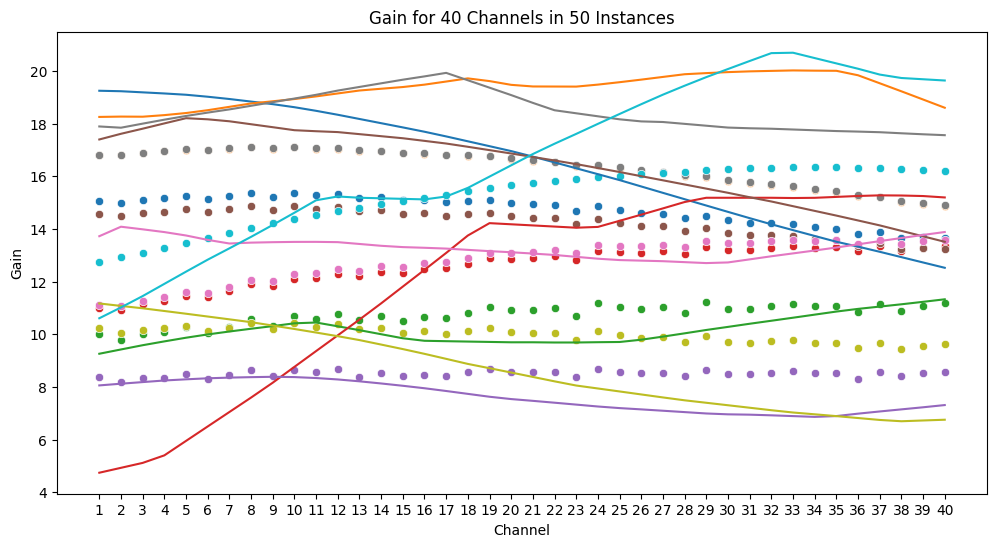

In [156]:
import matplotlib.pyplot as plt
import seaborn as sns

model_op = test_predictions.numpy()
model_true = Y_test.numpy()
model_op = pd.DataFrame(model_op, columns=[f'{i+1}' for i in range(model_op.shape[1])])
model_true = pd.DataFrame(model_true, columns=[f'{i+1}' for i in range(model_true.shape[1])])


plt.figure(figsize=(12, 6))
for i in range(10):
    sns.scatterplot(x=model_op.columns, y=model_op.iloc[i, :])
    sns.lineplot(x=model_true.columns, y=model_true.iloc[i, :])   
plt.title('Gain for 40 Channels in 50 Instances')
plt.xlabel('Channel')
plt.ylabel('Gain')
plt.show()

In [198]:
class MultiLayerNN:
    def __init__(self, input_dim, hidden_dims, output_dim):
        self.input_dim = input_dim
        self.hidden_dims = hidden_dims
        self.output_dim = output_dim

        # Initialize weights for hidden layers randomly
        self.hidden_weights = [torch.randn(input_dim if i == 0 else hidden_dims[i - 1], hidden_dims[i]) for i in range(len(hidden_dims))]
        self.hidden_biases = [torch.randn(1, hidden_dims[i]) for i in range(len(hidden_dims))]
        self.output_weights = None  # To be computed using Moore-Penrose pseudo inverse

    def forward(self, X):
        activations = X
        for W, b in zip(self.hidden_weights, self.hidden_biases):
            activations = torch.relu(torch.matmul(activations, W) + b)
        return activations

    def MPPI(self, X, Y):
        # Forward pass through hidden layers
        hidden_output = self.forward(X)

        # Compute Moore-Penrose pseudo inverse for the last layer weights
        pseudo_inverse = torch.pinverse(hidden_output)
        self.output_weights = torch.matmul(pseudo_inverse, Y)

    def predict(self, X):
        hidden_output = self.forward(X)
        return torch.matmul(hidden_output, self.output_weights)

class MultiLayerNN_normal:
    def __init__(self, input_dim, hidden_dims, output_dim, mean, std):
        self.input_dim = input_dim
        self.hidden_dims = hidden_dims
        self.output_dim = output_dim

        self.weights = [torch.normal(mean, std,size=(input_dim if i == 0 else hidden_dims[i - 1], hidden_dims[i])) for i in range(len(hidden_dims))]
        self.biases = [torch.normal(mean, std, size=(1, hidden_dims[i])) for i in range(len(hidden_dims))]
        self.output_weights = None

    def forward(self, X):
        activations = X
        for W, b in zip(self.weights, self.biases):
            activations = torch.relu(torch.matmul(activations, W) + b)
        return activations
    
    def MPPI (self, X, Y):
        hidden_output = self.forward(X)
        pseudo_inverse = torch.pinverse(hidden_output)
        self.output_weights = torch.matmul(pseudo_inverse, Y)
    
    def predict(self, X):
        hidden_output = self.forward(X)
        return torch.matmul(hidden_output, self.output_weights)
    

In [199]:
import torch

# He Initialization function
def he_init(shape):
    std = (2.0 / shape[0]) ** 0.5
    return torch.normal(0, std, size=shape)

# Xavier Initialization function
def xavier_init(shape):
    std = (1.0 / shape[0]) ** 0.5
    return torch.normal(0, std, size=shape)

# Class with He Initialization (wt1)
class MultiLayerNN_wt1:
    def __init__(self, input_dim, hidden_dims, output_dim):
        self.input_dim = input_dim
        self.hidden_dims = hidden_dims
        self.output_dim = output_dim

        # Initialize weights using He Initialization
        self.weights = [he_init((input_dim if i == 0 else hidden_dims[i - 1], hidden_dims[i])) for i in range(len(hidden_dims))]
        self.biases = [torch.normal(0, (2.0 / (hidden_dims[i])) ** 0.5, size=(1, hidden_dims[i])) for i in range(len(hidden_dims))]
        self.output_weights = None

    def forward(self, X):
        activations = X
        for W, b in zip(self.weights, self.biases):
            activations = torch.relu(torch.matmul(activations, W) + b)
        return activations

    def MPPI(self, X, Y):
        hidden_output = self.forward(X)
        pseudo_inverse = torch.pinverse(hidden_output)
        self.output_weights = torch.matmul(pseudo_inverse, Y)

    def predict(self, X):
        hidden_output = self.forward(X)
        return torch.matmul(hidden_output, self.output_weights)

# Class with Xavier Initialization (wt2)
class MultiLayerNN_wt2:
    def __init__(self, input_dim, hidden_dims, output_dim):
        self.input_dim = input_dim
        self.hidden_dims = hidden_dims
        self.output_dim = output_dim

        # Initialize weights using Xavier Initialization
        self.weights = [xavier_init((input_dim if i == 0 else hidden_dims[i - 1], hidden_dims[i])) for i in range(len(hidden_dims))]
        self.biases = [torch.normal(0, (1.0 / (hidden_dims[i])) ** 0.5, size=(1, hidden_dims[i])) for i in range(len(hidden_dims))]
        self.output_weights = None

    def forward(self, X):
        activations = X
        for W, b in zip(self.weights, self.biases):
            activations = torch.relu(torch.matmul(activations, W) + b)
        return activations

    def MPPI(self, X, Y):
        hidden_output = self.forward(X)
        pseudo_inverse = torch.pinverse(hidden_output)
        self.output_weights = torch.matmul(pseudo_inverse, Y)

    def predict(self, X):
        hidden_output = self.forward(X)
        return torch.matmul(hidden_output, self.output_weights)


In [207]:
input_dim = 6
hidden_dims = [10, 32, 10]
output_dim = 40
mean = 0
std = 0.04

model = MultiLayerNN_normal(input_dim, hidden_dims, output_dim, mean, std)
model_1 = MultiLayerNN_wt1(input_dim, hidden_dims, output_dim)
model_2 = MultiLayerNN_wt2(input_dim, hidden_dims, output_dim)
model_relu = MultiLayerNN(input_dim, hidden_dims, output_dim)

model_1.MPPI(X_train, Y_train)
model_2.MPPI(X_train, Y_train)
model.MPPI(X_train, Y_train)
model_relu.MPPI(X_train, Y_train)

predictions_normal = model.predict(X_test)
predictions1 = model_1.predict(X_test)
predictions2 = model_2.predict(X_test)  
predictions_relu = model_relu.predict(X_test)

##############################################

num_models = 20
models = []
for _ in range(num_models):
    temp_model = MultiLayerNN(input_dim, hidden_dims, output_dim)
    temp_model.MPPI(X_train, Y_train)
    models.append(temp_model)

def average_predictions(models, X):
    predictions = [model_relu.predict(X) for model in models]
    return torch.mean(torch.stack(predictions), dim=0)

avg_predictions_normal = average_predictions(models, X_test)

def average_modelling(models, number_of_models, hidden_dim, output_dim, mean=0, std=0):
    local_models = []
    for _ in range(number_of_models):
        if(models == MultiLayerNN_normal):
            temp_model = models(input_dim, hidden_dims, output_dim, mean, std)
        else:   
            temp_model = models(input_dim, hidden_dims, output_dim)
        temp_model.MPPI(X_train, Y_train)
        local_models.append(temp_model)
    return local_models

def average_predictions_all(model,models, X):
    if model == MultiLayerNN_normal:
        predictions = [model.predict(X) for ul in models]
    elif model == MultiLayerNN_wt1:
        predictions = [model_1.predict(X) for ul in models]
    elif model == MultiLayerNN_wt2:
        predictions = [model_2.predict(X) for ul in models]
    return predictions

models_1 = average_modelling(MultiLayerNN_normal, num_models, hidden_dims, output_dim, mean, std)
models_2 = average_modelling(MultiLayerNN_wt1, num_models, hidden_dims, output_dim)
models_3 = average_modelling(MultiLayerNN_wt2, num_models, hidden_dims, output_dim)
average_predictions_1 = average_predictions(models_1, X_test)
average_predictions_2 = average_predictions(models_2, X_test)
average_predictions_3 = average_predictions(models_3, X_test)

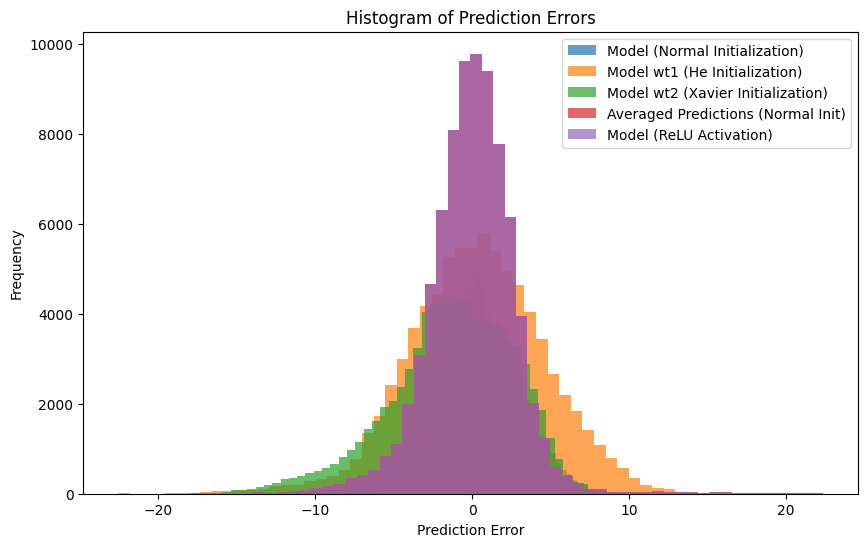

In [208]:
import matplotlib.pyplot as plt

# Compute prediction errors for each model
errors_normal = (predictions_normal - Y_test).detach().numpy().flatten()
errors_wt1 = (predictions1 - Y_test).detach().numpy().flatten()
errors_wt2 = (predictions2 - Y_test).detach().numpy().flatten()
errors_avg = (avg_predictions_normal - Y_test).detach().numpy().flatten()
errors_relu = (predictions_relu - Y_test).detach().numpy().flatten()

# Plot histogram for errors from model_normal
plt.figure(figsize=(10, 6))
plt.hist(errors_normal, bins=50, alpha=0.7, label="Model (Normal Initialization)")
plt.hist(errors_wt1, bins=50, alpha=0.7, label="Model wt1 (He Initialization)")
plt.hist(errors_wt2, bins=50, alpha=0.7, label="Model wt2 (Xavier Initialization)")
plt.hist(errors_avg, bins=50, alpha=0.7, label="Averaged Predictions (Normal Init)")
plt.hist(errors_relu, bins=50, alpha=0.7, label="Model (ReLU Activation)")
plt.title("Histogram of Prediction Errors")
plt.xlabel("Prediction Error")
plt.ylabel("Frequency")
plt.legend()
plt.show()


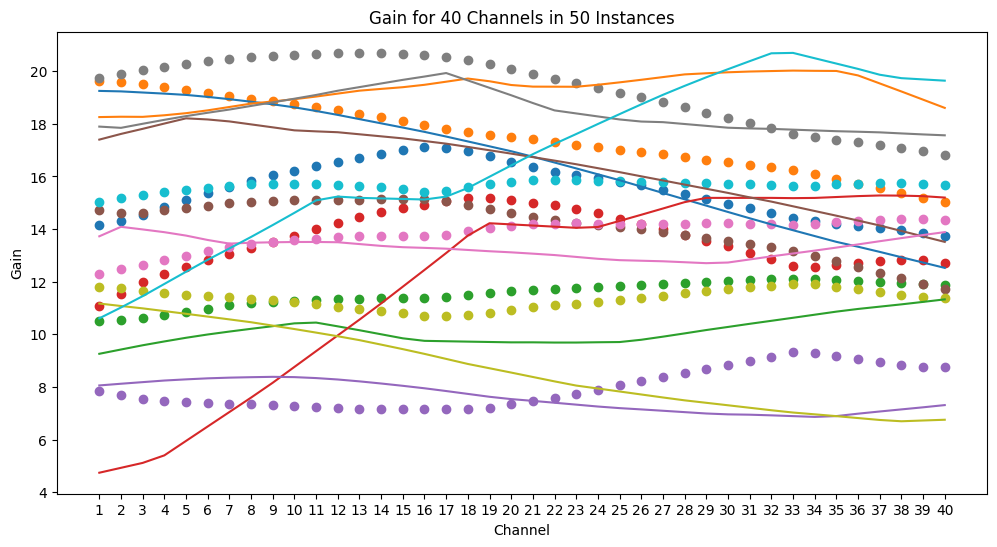

c:\Users\adop\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

c:\Users\adop\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

c:\Users\adop\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

c:\Users\adop\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

c:\Users\adop\AppData\Local\

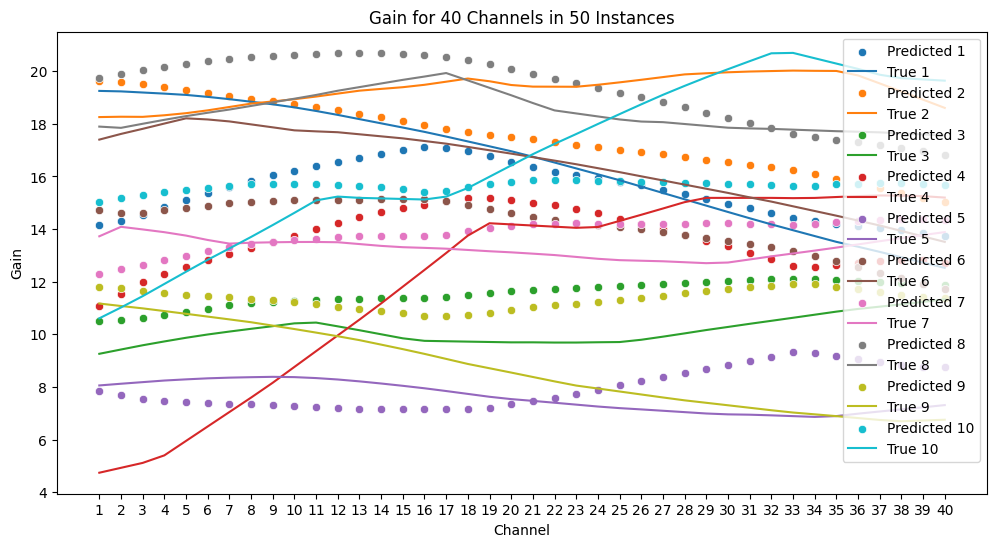

In [209]:
import seaborn as sns

linear_model_op = avg_predictions_normal.numpy()
linear_model_true = Y_test.numpy()
linear_model_op = pd.DataFrame(linear_model_op, columns=[f'{i+1}' for i in range(linear_model_op.shape[1])])
linear_model_true = pd.DataFrame(linear_model_true, columns=[f'{i+1}' for i in range(linear_model_true.shape[1])])

plt.figure(figsize=(12, 6))
for i in range(10):
    plt.scatter(linear_model_op.columns, linear_model_op.iloc[i, :])
    plt.plot(linear_model_true.columns, linear_model_true.iloc[i, :])   
plt.title('Gain for 40 Channels in 50 Instances')
plt.xlabel('Channel')
plt.ylabel('Gain')
plt.show()

# Rename columns to avoid cluttering
linear_model_op.columns = [f'{i+1}' for i in range(linear_model_op.shape[1])]
linear_model_true.columns = [f'{i+1}' for i in range(linear_model_true.shape[1])]

# Plot using seaborn
plt.figure(figsize=(12, 6))
for i in range(10):
    sns.scatterplot(x=linear_model_op.columns, y=linear_model_op.iloc[i, :], label=f'Predicted {i+1}')
    sns.lineplot(x=linear_model_true.columns, y=linear_model_true.iloc[i, :], label=f'True {i+1}')
plt.title('Gain for 40 Channels in 50 Instances')
plt.xlabel('Channel')
plt.ylabel('Gain')
plt.legend()
plt.legend(loc='upper right')
plt.show()